In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
import pandas as pd
from pandas.plotting import register_matplotlib_converters
import os
import math
from sklearn.cluster import KMeans
from sklearn.metrics import precision_score
import seaborn as sns
from sklearn import metrics
import time
import pickle
import metric_learn
from sklearn.decomposition import PCA  
from sklearn import cluster, datasets, mixture
from sklearn.neighbors import LocalOutlierFactor
import functools
import tensorflow as tf
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, losses
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.models import Model
from tensorflow.python.client import device_lib; print(device_lib.list_local_devices())
import tensorflow as tf
tf.config.list_physical_devices('GPU')
from utils import make_data, make_data_rev, make_label, calc_leq, leq_filter, validate, figure, figure_detail, plot_timeseries, fig_pr, auc_gs, fig_th_f

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 6990973122956726564
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 7798259712
locality {
  bus_id: 1
  links {
  }
}
incarnation: 1822255800779702022
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 3080, pci bus id: 0000:01:00.0, compute capability: 8.6"
xla_global_id: 416903419
]
[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 7766159684499636096
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 7798259712
locality {
  bus_id: 1
  links {
  }
}
incarnation: 1356559175529576413
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 3080, pci bus id: 0000:01:00.0, compute capability: 8.6"
xla_global_id: 416903419
]


In [3]:
data_dir='filtered_csv_label'
original = pd.read_csv( os.path.join(data_dir, 'learning_data_10.csv') )
df = pd.read_csv( os.path.join(data_dir, 'learning_data_10.csv') )
df=df[df['day']<=9]
df

,original,label,time,day
0,53.4,0,15,0
1,52.8,0,15,0
2,52.8,0,15,0
3,53.2,0,15,0
4,53.6,0,15,0
...,...,...,...,...
3995345,45.9,0,5,9
3995346,45.6,0,5,9
3995347,45.8,0,5,9
3995348,45.7,0,5,9


# ホールドアウト検証
## 訓練、テストへ分割
* テスト（最終評価用）：6, 7, 8, 9 日目
---
ラベル付け
* 全体：0, 1, 2, 3, 4, 5 日目
* 訓練ローテ：(訓練、ラベル付与対象)=([0, 1, 2, 3, 4], 5)・・・([5, 0, 1, 2, 3], 4)

In [4]:
test_day=[6, 7, 8, 9]
semi_train_day=[0, 1, 2, 3, 4, 5]

test_df=df[(df['day'].isin(test_day))].reset_index(drop=True)
semi_train_df=df[(df['day'].isin(semi_train_day))].reset_index(drop=True)

In [5]:
df_list=[]

window=20
for i in set(df['day']):
    lag=[] 
    lag.append(make_data(semi_train_df.loc[semi_train_df['day']==i, ['original']], 'original', window))
    lag.append(semi_train_df.loc[semi_train_df['day']==i, ['day']])
    lag.append(semi_train_df.loc[semi_train_df['day']==i, ['label']])
    df_add_lag=pd.concat(lag, axis=1)
    df_list.append(df_add_lag)
semi_train_df=pd.concat(df_list)
semi_train_df=semi_train_df.dropna().reset_index(drop=True)
semi_train_df.loc[:, 'aed']=0
semi_train_df.loc[:, 'aed_label']=0

In [6]:
semi_train_df

,original,original_lag1,original_lag2,original_lag3,original_lag4,original_lag5,original_lag6,original_lag7,original_lag8,original_lag9,...,original_lag14,original_lag15,original_lag16,original_lag17,original_lag18,original_lag19,day,label,aed,aed_label
0,55.2,55.0,55.0,54.9,54.9,54.9,55.0,55.7,55.8,55.6,...,54.0,53.6,53.2,52.8,52.8,53.4,0,0,0,0
1,54.7,55.2,55.0,55.0,54.9,54.9,54.9,55.0,55.7,55.8,...,54.7,54.0,53.6,53.2,52.8,52.8,0,0,0,0
2,54.4,54.7,55.2,55.0,55.0,54.9,54.9,54.9,55.0,55.7,...,55.7,54.7,54.0,53.6,53.2,52.8,0,0,0,0
3,54.5,54.4,54.7,55.2,55.0,55.0,54.9,54.9,54.9,55.0,...,55.5,55.7,54.7,54.0,53.6,53.2,0,0,0,0
4,54.3,54.5,54.4,54.7,55.2,55.0,55.0,54.9,54.9,54.9,...,55.7,55.5,55.7,54.7,54.0,53.6,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2393291,45.0,45.4,45.1,44.8,45.4,45.6,45.0,45.7,45.1,44.9,...,45.2,45.3,44.8,45.0,45.0,45.0,5,0,0,0
2393292,45.2,45.0,45.4,45.1,44.8,45.4,45.6,45.0,45.7,45.1,...,45.0,45.2,45.3,44.8,45.0,45.0,5,0,0,0
2393293,45.1,45.2,45.0,45.4,45.1,44.8,45.4,45.6,45.0,45.7,...,44.6,45.0,45.2,45.3,44.8,45.0,5,0,0,0
2393294,45.1,45.1,45.2,45.0,45.4,45.1,44.8,45.4,45.6,45.0,...,45.2,44.6,45.0,45.2,45.3,44.8,5,0,0,0


In [7]:
labeling_day_num=1
cv_comb=np.array(semi_train_day).reshape((-1, labeling_day_num)).tolist()
cv_comb

[[0], [1], [2], [3], [4], [5]]

## オートエンコーダでラベル付与

In [8]:
class AnomalyDetector(Model):
    def __init__(self):
        super().__init__()
        self.encoder = tf.keras.Sequential([
          layers.Dense(15, activation="relu"),
          layers.Dense(10, activation="relu"),
          layers.Dense(4, activation="relu")])

        self.decoder = tf.keras.Sequential([
          layers.Dense(10, activation="relu"),
          layers.Dense(15, activation="relu"),
          layers.Dense(20, activation="sigmoid")])

    def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

In [10]:
cv_comb=[[1]]

In [13]:
for i in cv_comb:
    label_train_day=[k for k in semi_train_day if k not in i]
    label_grant_day=i
    print(f'訓練データ：{label_train_day}')
    print(f'ラベル付与データ：{label_grant_day}日目')

    semi_train_x=semi_train_df[(semi_train_df['day'].isin(label_train_day))][semi_train_df.columns[:-4]].reset_index(drop=True)
    labeling_x=semi_train_df[(semi_train_df['day'].isin(label_grant_day))][semi_train_df.columns[:-4]].reset_index(drop=True)
    # tf.reduce_min関数を使用して、train_dataテンソル内の最小値を計算しています。
    # min_valにはtrain_data内の最小値が代入されます。
    min_val = tf.reduce_min(semi_train_x)

    # tf.reduce_max関数を使用して、train_dataテンソル内の最大値を計算しています。
    # max_valにはtrain_data内の最大値が代入されます。
    max_val = tf.reduce_max(semi_train_x)

    train_data = (semi_train_x - min_val) / (max_val - min_val)
    labeling_data = (labeling_x - min_val) / (max_val - min_val)
    # データの型をtf.float32に変換
    train_data = tf.cast(train_data, tf.float32)
    labeling_data = tf.cast(labeling_data, tf.float32)
    
    autoencoder = AnomalyDetector()
    autoencoder.compile(optimizer='adam', loss='mae')
    history = autoencoder.fit(train_data, train_data, 
          epochs=50, 
          batch_size=512,
          validation_data=(labeling_data, labeling_data),
          shuffle=True)
    plt.plot(history.history["loss"], label="Training Loss")
    plt.plot(history.history["val_loss"], label="Validation Loss")
    plt.legend()
    plt.show()

    reconstructions = autoencoder.predict(labeling_data)
#     異常度算出
    d= tf.keras.losses.mae(reconstructions, labeling_data).numpy()
    semi_train_df.loc[semi_train_df['day'].isin(label_grant_day), 'aed']=d
    print('------------------------------------------------------')

訓練データ：[0, 2, 3, 4, 5]
ラベル付与データ：[1]日目
Epoch 1/50
4113/4113 [==============================] - 16s 4ms/step - loss: 0.0253 - val_loss: 0.0188
Epoch 2/50
4113/4113 [==============================] - 15s 4ms/step - loss: 0.0145 - val_loss: 0.0186
Epoch 3/50
4113/4113 [==============================] - 14s 3ms/step - loss: 0.0145 - val_loss: 0.0186
Epoch 4/50
4113/4113 [==============================] - 15s 4ms/step - loss: 0.0145 - val_loss: 0.0186
Epoch 5/50
4113/4113 [==============================] - 15s 4ms/step - loss: 0.0098 - val_loss: 0.0093
Epoch 6/50
4113/4113 [==============================] - 15s 4ms/step - loss: 0.0071 - val_loss: 0.0092
Epoch 7/50
1674/4113 [===========>..................] - ETA: 8s - loss: 0.0070

KeyboardInterrupt: 

In [12]:
labeling_day_num=1
cv_comb=np.array(semi_train_day).reshape((-1, labeling_day_num)).tolist()
for i in cv_comb:
    label_grant_day=i
    print(f'ラベル付与データ：{label_grant_day}日目')
    d=semi_train_df.loc[(semi_train_df['day'].isin(label_grant_day)), 'aed'].values

    #閾値設定
    #kmeans
    n_clusters=2
    #init default=’k-means++’
    model = KMeans(n_clusters=n_clusters, n_init=10)  
    model.fit(d.reshape((-1, 1)))
    clusters = model.predict(d.reshape((-1, 1)))  
    result=pd.DataFrame({'d':d, 'cluster':clusters})
    thr_list=[]
    for j in range(n_clusters):
        thr_list.append(result.loc[result['cluster']==j, 'd'].max())
    thr_min=sorted(thr_list)[-2]
    thr_max=sorted(thr_list)[-1]
    thr_range=result.loc[(result['d']>thr_min)&(result['d']<=thr_max), ['d']]
    Q1 = float(thr_range.quantile(0.25).iloc[0])
    Q3 = float(thr_range.quantile(0.75).iloc[0])
    IQR = Q3 - Q1
    thr = min(float(Q3 + 1.5 * IQR), thr_max)


    semi_train_df.loc[semi_train_df['day'].isin(label_grant_day), 'aed_label']\
    = np.where(semi_train_df.loc[semi_train_df['day'].isin(label_grant_day), 'aed']>=thr, 1, 0)

    semi_train_df.loc[semi_train_df['day'].isin(label_grant_day), 'aed']\
    =(semi_train_df.loc[semi_train_df['day'].isin(label_grant_day), 'aed']-semi_train_df.loc[semi_train_df['day'].isin(label_grant_day), 'aed'].min())/(semi_train_df.loc[semi_train_df['day'].isin(label_grant_day), 'aed'].max()-semi_train_df.loc[semi_train_df['day'].isin(label_grant_day), 'aed'].min())

ラベル付与データ：[0]日目
ラベル付与データ：[1]日目
ラベル付与データ：[2]日目
ラベル付与データ：[3]日目
ラベル付与データ：[4]日目
ラベル付与データ：[5]日目


In [17]:
check_day=1
check_test_v=semi_train_df.loc[semi_train_df['day']==check_day, ['original','day','label', 'aed', 'aed_label']]
check_d_test=check_test_v['aed_label'].values
check_test_v=figure(check_test_v, check_d_test, thr)

## 半教師あり学習の結果を取得

In [27]:
original=pd.read_csv('semi_train_data/autoencoder/4_semi_train_df.csv', index_col=0)
original

,original,day,label,aed,aed_label
0,55.2,0,0,0.035392,0
1,54.7,0,0,0.016427,0
2,54.4,0,0,0.021976,0
3,54.5,0,0,0.026714,0
4,54.3,0,0,0.030942,0
...,...,...,...,...,...
2393291,45.0,5,0,0.030970,0
2393292,45.2,5,0,0.026271,0
2393293,45.1,5,0,0.028818,0
2393294,45.1,5,0,0.029694,0


In [33]:
test_day=[1]
test_v=original[original['day'].isin(test_day)][['original', 'label', 'day', 'aed']].reset_index(drop=True)
test_v

,original,label,day,aed
0,44.5,0,1,0.023650
1,44.5,0,1,0.024299
2,44.9,0,1,0.021740
3,44.9,0,1,0.018861
4,44.2,0,1,0.026169
...,...,...,...,...
287461,46.0,0,1,0.023582
287462,46.0,0,1,0.010744
287463,45.9,0,1,0.009391
287464,45.9,0,1,0.008549


In [31]:
d=test_v['aed'].values
d

array([0.02364983, 0.02429858, 0.02173983, ..., 0.00939089, 0.00854881,
       0.00700298])

In [42]:
#kmeans
n_clusters=2
model = KMeans(n_clusters=n_clusters)  
model.fit(d.reshape((-1, 1)))
clusters = model.predict(d.reshape((-1, 1)))  
result=pd.DataFrame({'d':d, 'cluster':clusters})
thr_list=[]
for j in range(n_clusters):
    thr_list.append(result.loc[result['cluster']==j, 'd'].max())
thr_min=sorted(thr_list)[-2]
thr_max=sorted(thr_list)[-1]
thr_range=result.loc[(result['d']>thr_min)&(result['d']<=thr_max), ['d']]
Q1 = thr_range.quantile(0.25)
Q3 = thr_range.quantile(0.75)
IQR = Q3 - Q1
thr = min(float(Q3 + 1.5 * IQR), thr_max)
print(f'閾値{thr}')

C:\Users\Arakawa\anaconda3\envs\tf291\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


閾値0.5513603596638496


C:\Users\Arakawa\AppData\Local\Temp\ipykernel_4032\2189138096.py:16: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  thr = min(float(Q3 + 1.2 * IQR), thr_max)


In [52]:
thr=0.388
precision, recall=validate(test_v, d, thr)
f_score=(2*precision*recall)/(precision+recall)
print('\033[31m'+f'F値：{f_score}'+'\033[0m')
print(f'適合率：{precision}')
print(f'再現率：{recall}')

F値：0.8530682782328085
適合率：0.9008171315863623
再現率：0.810126582278481


In [19]:
check_day=1
check_test_v=semi_train_df.loc[semi_train_df['day']==check_day, ['original','day','label', 'aed', 'aed_label']]
check_d_test=check_test_v['aed_label'].values
thr=0
check_test_v=figure(check_test_v, check_d_test, thr)

## 異常度グラフズーム

In [55]:
def figure_detail2(df_test, d_test, start=0, stop=60):
    plt.rcParams["font.size"] = 22
    plt.rcParams["font.family"] = "Times New Roman"
    
    start_data=int(math.floor(start)*60/0.2)
    stop_data=int(math.ceil(stop)*60/0.2)

    test_plot=df_test['original'].values[start_data:stop_data]
    d=d_test[start_data:stop_data]
    label=df_test['label'].values[start_data:stop_data]*100
    label_index=range(len(label))
    time=[t*0.2/60 for t in range(start_data, stop_data)]
    fig, ax=plt.subplots(1, 1, figsize=(35, 8))
    ax.plot(time, test_plot, color='#6687AF' ,linewidth = 3, label='Noise Level')
    ax2=ax.twinx()
    ax2.plot(time, d, color='#F17B51',linewidth = 3, label='Anomaly Score')
    ax.fill_between(time, label,  facecolor='#D9D9D9', label='Abnormal period' )
    ax.set_xticks(np.arange(math.floor(start), math.ceil(stop), 2))
    ax.set_xticklabels(np.arange(math.floor(start), math.ceil(stop), 2), fontsize=50)
#     ax.xaxis.set_tick_params(rotation=30)
    ax.set_xlim(start, stop)
    ax.set_yticks(np.arange(40, 90, 10))
    ax.set_yticklabels(np.arange(40, 90, 10), fontsize=60)        
    ax.set_ylim(40, 80)
    ax2.set_yticks(np.arange(0, 12, 2)/10)
    ax2.set_yticklabels(np.arange(0, 12, 2)/10, fontsize=60)
    ax2.set_ylim(0, 1)
    ax.set_ylim(10, 80)
    h1, l1 = ax.get_legend_handles_labels()
    h2, l2 = ax2.get_legend_handles_labels()
    ax.legend(h2+h1, l2+l1, loc='upper center', bbox_to_anchor=(.5, 1.3), ncol=3, prop={'family':"MS Mincho", 'size':60})
    ax.set_xlabel('Time(min)', fontfamily="MS Mincho",fontsize=60)
    ax.set_ylabel('Noise Level(dB)', fontfamily="MS Mincho",fontsize=60, loc='top')
    ax2.set_ylabel(' Anomaly Score', fontfamily="MS Mincho",fontsize=60, loc='bottom')
#     plt.grid(True)
    plt.show()    

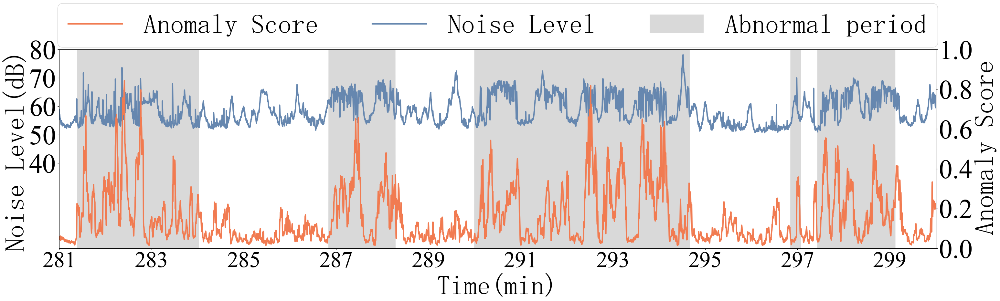

In [56]:
start=281
stop=300
figure_detail2(test_v, d, start, stop)

## 半教師あり学習の結果を保存

In [18]:
semi_train_df[['original', 'day', 'label', 'aed', 'aed_label']].to_csv('semi_train_data/autoencoder/4_semi_train_df.csv')